In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import random
import glob
import collections
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import pickle
%matplotlib inline

In [2]:
def apply_sobel(img, kernel_size = 3, axis = 'x', threshold=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if axis == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, kernel_size)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, kernel_size)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    return sxbinary

def apply_sobel_xy(img, kernel_size = 3, threshold=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, kernel_size)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, kernel_size)
    sobel_mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*sobel_mag/np.max(sobel_mag))
    sxybinary = np.zeros_like(scaled_sobel)
    sxybinary[(scaled_sobel >= threshold[0]) & (scaled_sobel <= threshold[1])] = 1
    return sxybinary

def sat_filter(img, threshold=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_output = np.zeros_like(s)
    binary_output[(s > threshold[0]) & (s <= threshold[1])] = 1
    return binary_output    

def hue_filter(img, threshold=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:,:,0]
    binary_output = np.zeros_like(h)
    binary_output[(h > threshold[0]) & (h <= threshold[1])] = 1
    return binary_output

def undistort_img(img):
    with open("camera_cal.p", mode='rb') as camera_cal:
        camera_cal = pickle.load(camera_cal)

        mtx = camera_cal["mtx"]
        dist = camera_cal["dist"]

        undist_img = cv2.undistort(img, mtx, dist, None, mtx)
        return undist_img
    
def front_to_top_view(img): #perspective transform / warp image
    sizex = img.shape[0] # 720
    sizey = img.shape[1] # 1280
    src = np.float32([[590,470], [245,719], [1145, 719],[735,470]])
    dst = np.float32([[320,0], [320,720], [960, 720],[960,0]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, (sizey, sizex), flags=cv2.INTER_LINEAR)
    return {'warped':warped, 'dst':dst, 'src':src, 'M': M, 'Minv': Minv}

def fit_polynomial(top_view, left_fit_var = None, right_fit_var = None, nwindows = 20, margin = 50, minpix = 50):
    
    histogram = np.sum(top_view[top_view.shape[0]//2:,:], axis=0)    
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    out_img = np.dstack((top_view, top_view, top_view))*255
    window_height = np.int(top_view.shape[0]/nwindows)
        
    nonzero = top_view.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])    
    left_lane_inds = []
    right_lane_inds = []
    
    if left_fit_var == None: 
        for window in range(nwindows):
            win_y_low = top_view.shape[0] - (window+1)*window_height
            win_y_high = top_view.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                              (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                               (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))            
            
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)     
        
    else: # Search from prior fit values
        margin = 75        
        left_fit_line = np.polyval(left_fit_var, nonzeroy)
        right_fit_line = np.polyval(right_fit_var, nonzeroy)

        left_lane_inds = ((nonzerox > (left_fit_line - margin)) & (nonzerox < left_fit_line + margin))
        right_lane_inds = ((nonzerox > (right_fit_line - margin)) & (nonzerox < (right_fit_line + margin)))
        
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_var = np.polyfit(lefty, leftx, 2)
    right_fit_var = np.polyfit(righty, rightx, 2)
        
    ym_per_pix = 30.0/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
      
    # Fitting for real world values
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2) #metres
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) #metres# Calculate radii of curvature
      
    y_eval = top_view.shape[0] - 1 # position at which curvature is calculated
    left_curverad = ((1 + (2*left_fit_m[0]*y_eval*ym_per_pix + left_fit_m[1])**2)**1.5) / np.absolute(2*left_fit_m[0])
    right_curverad = ((1 + (2*right_fit_m[0]*y_eval*ym_per_pix + right_fit_m[1])**2)**1.5) / np.absolute(2*right_fit_m[0])
    lane_curvature = 0.5 * (left_curverad + right_curverad) 
        
    # Camera Offset
    lane_width = rightx_base - leftx_base
    lane_center = leftx_base + (lane_width/2)
    cam_location = top_view.shape[1] / 2
    cam_offset = (cam_location - lane_center) * xm_per_pix
        
    if cam_offset < 0:
        offset_dir = 'left'
    else:
        offset_dir = 'right'
     
    offset = {'cam_offset':cam_offset, 'offset_dir':offset_dir}
        
    return {'left_fit_var':left_fit_var,'right_fit_var':right_fit_var,\
            'nonzerox':nonzerox,'nonzeroy':nonzeroy,\
            'left_lane_inds':left_lane_inds,'right_lane_inds':right_lane_inds,\
            'lane_curvature':lane_curvature,\
            'left_fit_m':left_fit_m,'right_fit_m':right_fit_m,\
            'offset':offset, 'out_img':out_img }

def lane_color_and_top_2_frnt(top_view, undistorted_img, Minv, left_fitx, right_fitx, ploty):
    top_view_zero = np.zeros_like(top_view).astype(np.uint8)
    top_view_color = np.dstack((top_view_zero, top_view_zero, top_view_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts_lane = np.hstack((pts_left, pts_right))
    cv2.fillPoly(top_view_color, np.int_([pts_lane]), (0,255,0))
    front_view_color = cv2.warpPerspective(top_view_color, Minv, (undistorted_img.shape[1], undistorted_img.shape[0])) 
    result = cv2.addWeighted(undistorted_img, 1, front_view_color, 0.3, 0)
    return result
    
def add_curve_and_offset_info(img, curvature, offset):
    font = cv2.FONT_HERSHEY_SIMPLEX;
    cam_offset = offset['cam_offset']
    offset_dir = offset['offset_dir']
    curv_text = 'Curvature Radius: ' + str(curvature) + ' m' 
    offset_text = 'Vehicle offset: ' + str(abs(cam_offset)) + ' m towards ' + offset_dir
    cv2.putText(img, curv_text, (50, 50), font, 1, (0, 255, 0), 2, cv2.LINE_AA)
    cv2.putText(img, offset_text, (50, 100), font, 1, (0, 255, 0), 2, cv2.LINE_AA)
    return img    

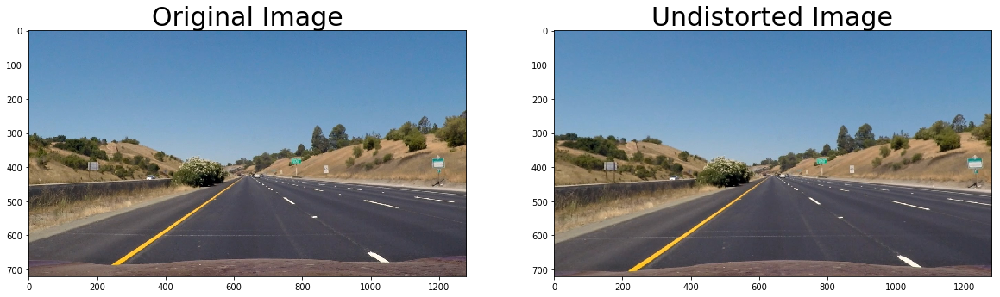

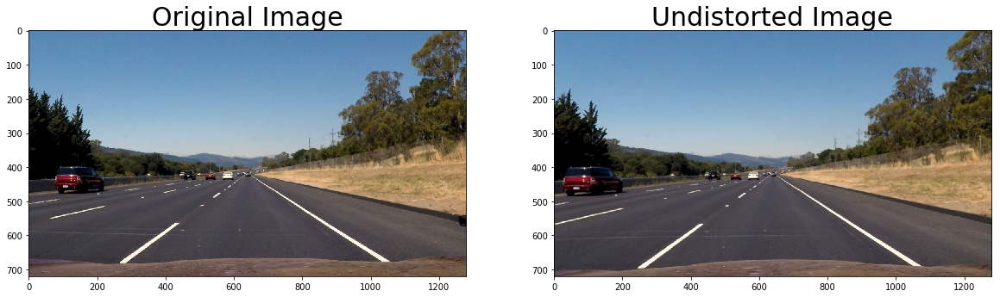

In [3]:
# TEST STRAIGHT LINE IMAGES:
for i in range(2):
    load_path = 'test_images/straight_lines' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(raw_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(und_img)
    ax2.set_title('Undistorted Image', fontsize=30)

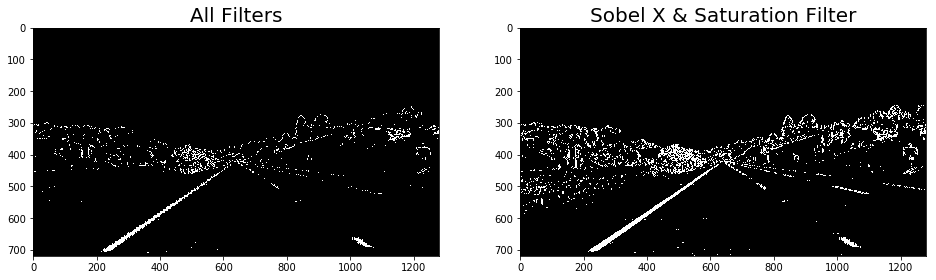

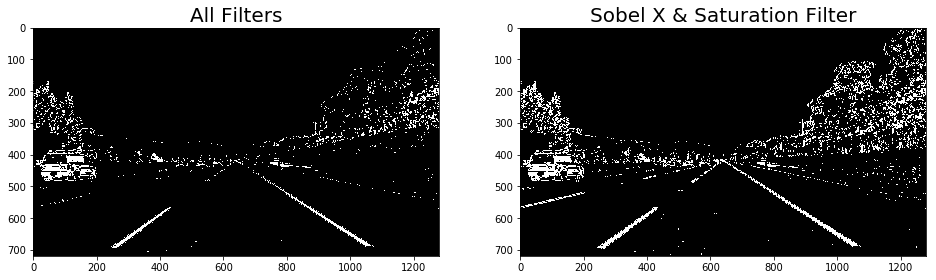

In [4]:
for i in range(2):
    load_path = 'test_images/straight_lines' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)    # Apply each of the thresholding functions
    
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    combined2 = np.zeros_like(sobel_x)
    combined2[(sobel_x == 1)|(s_binary == 1)] = 1
    combined3 = np.zeros_like(sobel_x)
    combined3[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
    ax1.imshow(combined1, cmap='gray')
    ax1.set_title('All Filters', fontsize=20)
    ax2.imshow(combined2, cmap='gray')
    ax2.set_title('Sobel X & Saturation Filter', fontsize=20)

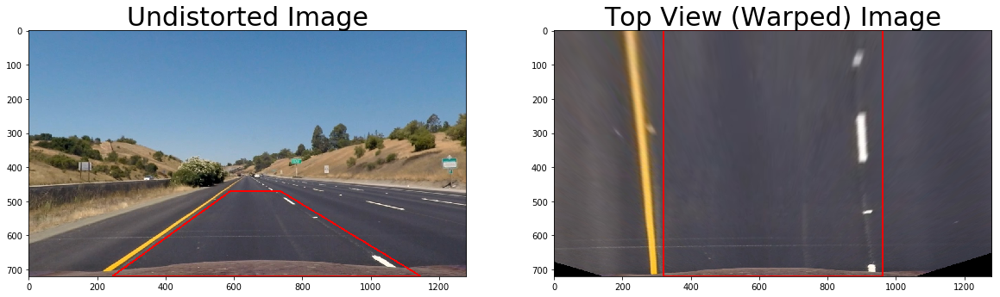

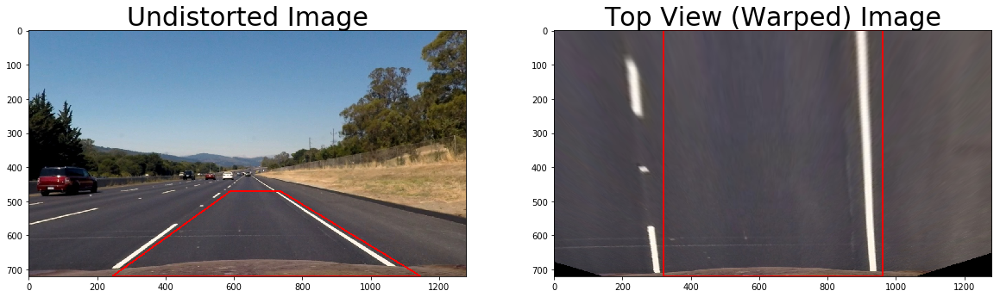

In [5]:
for i in range(2):
    load_path = 'test_images/straight_lines' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)    # Apply each of the thresholding functions
    
    # FILTERING OMITTED WHILE DISPLAYING TOP VIEW
    # BUT IN PIPELINE, FILTERING STEP SHOULD BE DONE BEFORE CONVERTING TO TOP VIEW
    
    top_view = front_to_top_view(und_img)
    warped = top_view['warped']
    dst = top_view['dst']
    src = top_view['src']
    Minv = top_view['Minv'] # save for use in step 6

    pts1 = np.array(src, np.int32)
    pts1 = pts1.reshape((-1,1,2))
    cv2.polylines(und_img,[pts1],True,(255,0,0),3)

    pts2 = np.array(dst, np.int32)
    pts2 = pts2.reshape((-1,1,2))
    cv2.polylines(warped,[pts2],True,(255,0,0),3)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(und_img)
    ax1.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(warped)
    ax2.set_title('Top View (Warped) Image', fontsize=30)
    

Curvature Radius: 3888.90969879m
Car offset: 0.211428571429m towards right
left_fit_var:  [ -4.37272742e-05   1.29163547e-01   2.21922740e+02] 
 right_fit_var:  [  4.08434794e-05   3.41006166e-02   8.84072871e+02] 

Curvature Radius: 159773.727473m
Car offset: 0.177071428571m towards right
left_fit_var:  [ -9.10755198e-06   1.28588186e-01   2.13300490e+02] 
 right_fit_var:  [ -5.44712360e-07   4.93337393e-02   8.95510209e+02] 



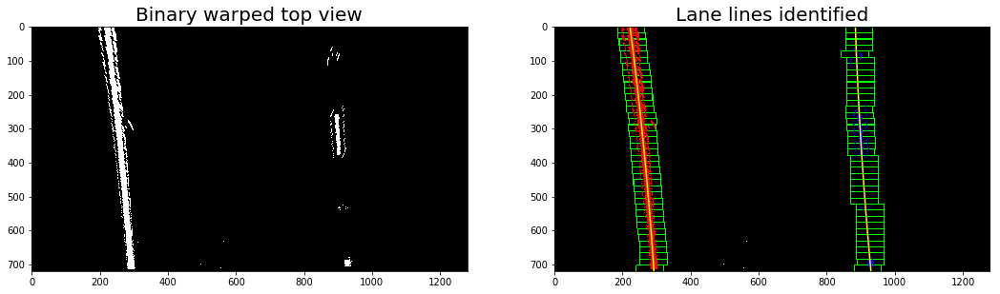

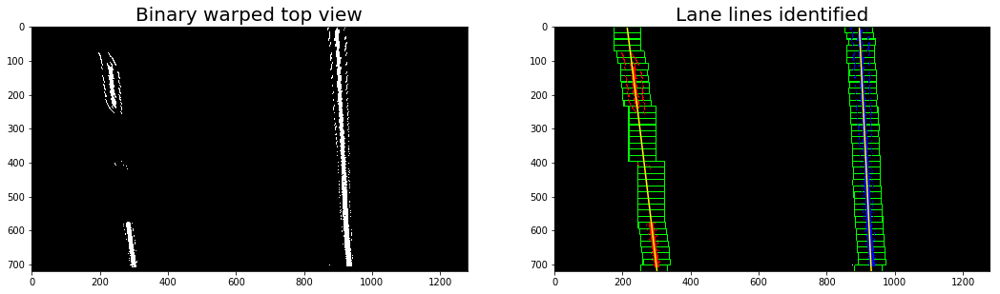

In [6]:
for i in range(2):
    load_path = 'test_images/straight_lines' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)    # Apply each of the thresholding functions 
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    top_view = front_to_top_view(combined1)
    warped = top_view['warped']    

    fit_poly = fit_polynomial(warped, nwindows = 40, margin = 40, minpix = 40)
    
    # FIT VARIABLES
    left_fit_var = fit_poly['left_fit_var']
    right_fit_var = fit_poly['right_fit_var']
    
    # ALL NON ZERO INDICES INDICATING WHITE POINTS
    nonzerox= fit_poly['nonzerox']
    nonzeroy = fit_poly['nonzeroy']
    
    # INDICES CORRESPONDING TO LANES
    left_lane_inds = fit_poly['left_lane_inds']
    right_lane_inds = fit_poly['right_lane_inds']
    
    lane_curvature = fit_poly['lane_curvature'] 
    
    left_fit_m = fit_poly['left_fit_m']
    right_fit_m = fit_poly['right_fit_m']
    
    offset = fit_poly['offset']
    out_img = fit_poly['out_img']
    
    print('Curvature Radius: ' + str(lane_curvature) + 'm')
    print('Car offset: ' + str(offset['cam_offset']) + 'm towards ' + offset['offset_dir'])
    
    y_values = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_lane_x_pts = left_fit_var[0]*y_values**2 + left_fit_var[1]*y_values + left_fit_var[2]
    right_lane_x_pts = right_fit_var[0]*y_values**2 + right_fit_var[1]*y_values + right_fit_var[2]
    print('left_fit_var: ',left_fit_var,'\n','right_fit_var: ',right_fit_var,'\n')
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize = (18,9))
    ax1.imshow(warped, cmap = 'gray')
    ax1.set_title('Binary warped top view', fontsize = 20)
    ax2.imshow(out_img)
    ax2.plot(left_lane_x_pts, y_values, color='yellow')
    ax2.plot(right_lane_x_pts, y_values, color='yellow')
    ax2.set_title('Lane lines identified', fontsize = 20)

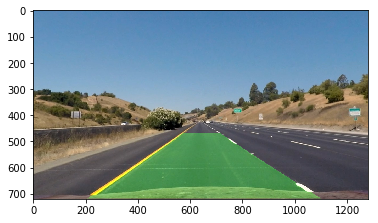

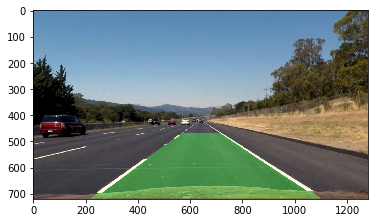

In [7]:
for i in range(2):
    load_path = 'test_images/straight_lines' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)    # Apply each of the thresholding functions 
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    top_view = front_to_top_view(combined1)
    warped = top_view['warped']    

    fit_poly = fit_polynomial(warped, nwindows = 40, margin = 40, minpix = 40)
    
    # FIT VARIABLES
    left_fit_var = fit_poly['left_fit_var']
    right_fit_var = fit_poly['right_fit_var']
    
    y_values = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_lane_x_pts = left_fit_var[0]*y_values**2 + left_fit_var[1]*y_values + left_fit_var[2]
    right_lane_x_pts = right_fit_var[0]*y_values**2 + right_fit_var[1]*y_values + right_fit_var[2]
    
    plt.figure()
    plt.imshow(lane_color_and_top_2_frnt(warped, und_img, Minv, left_lane_x_pts, right_lane_x_pts, y_values))

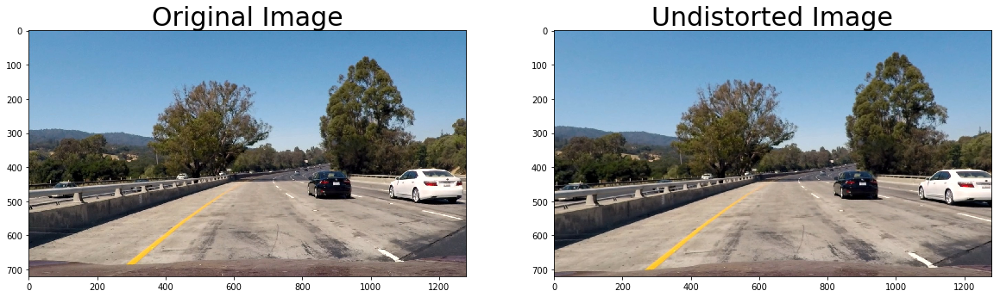

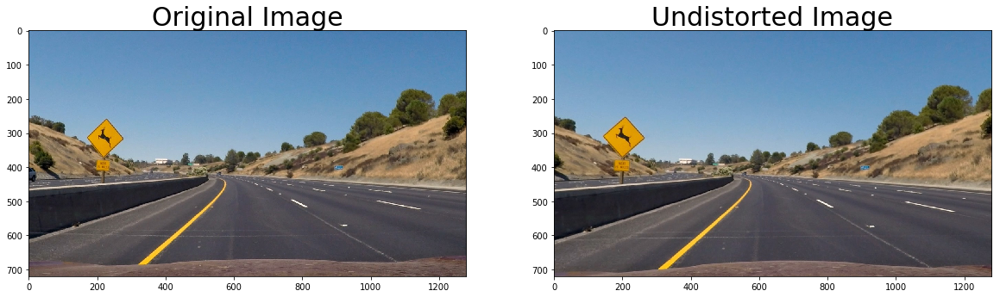

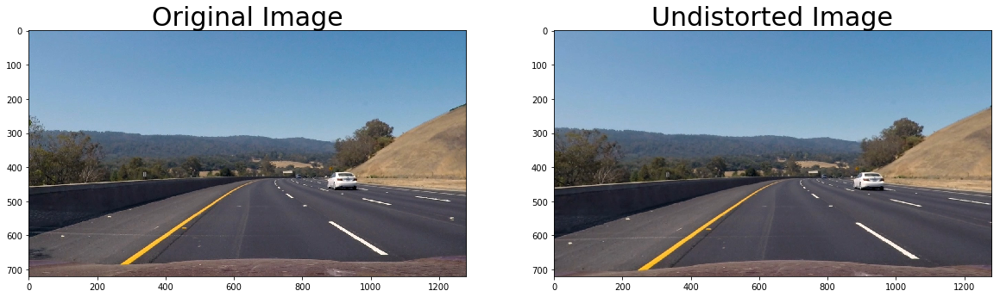

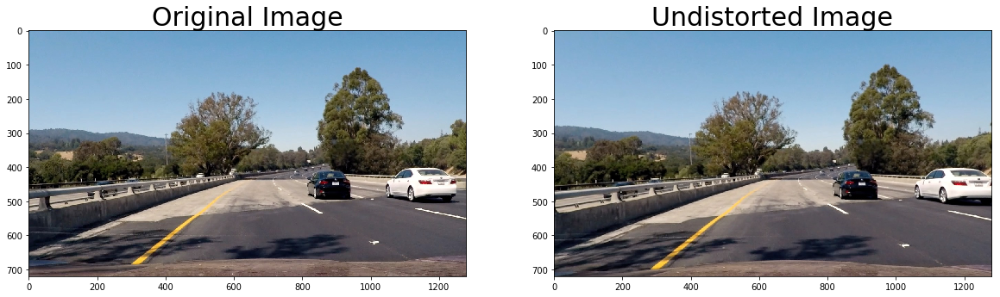

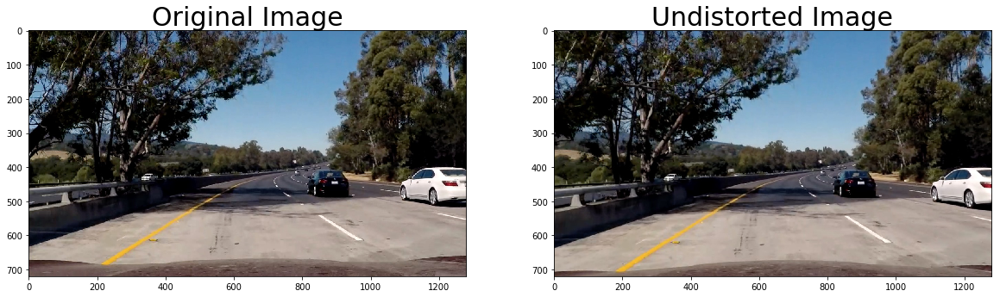

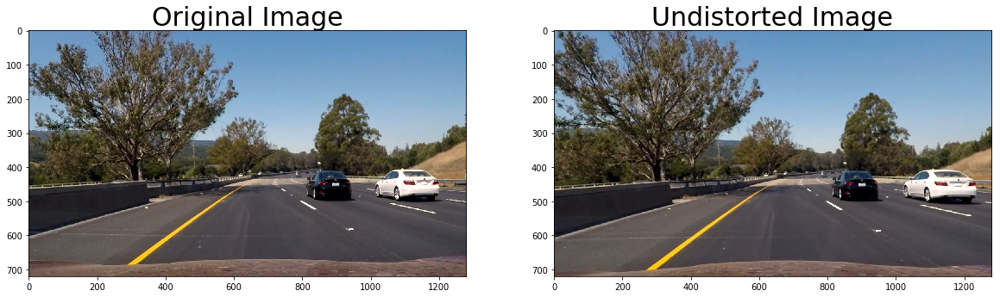

In [8]:
# TEST CURVED/ROAD IMAGES:
for i in range(6):
    load_path = 'test_images/test' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(raw_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(und_img)
    ax2.set_title('Undistorted Image', fontsize=30)

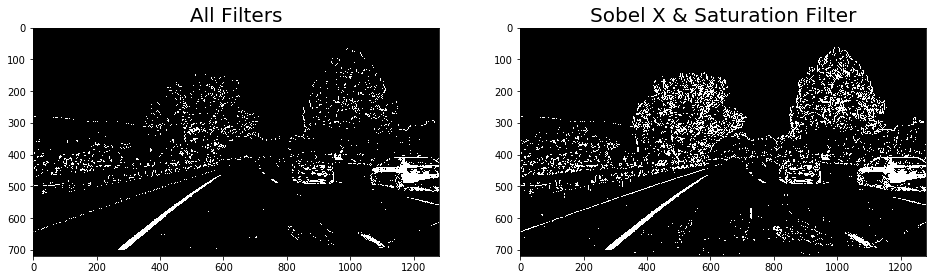

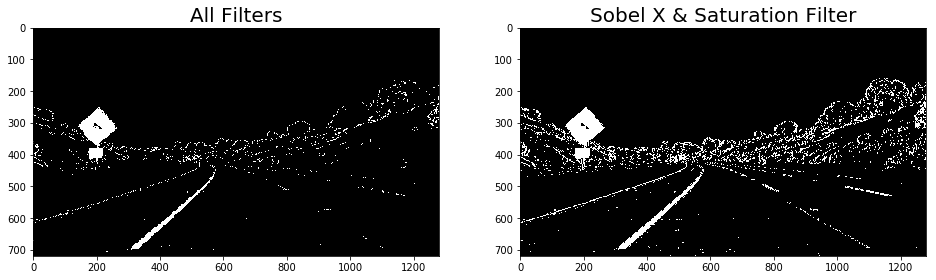

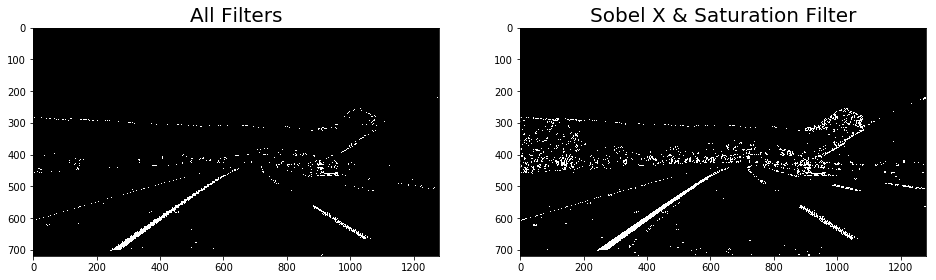

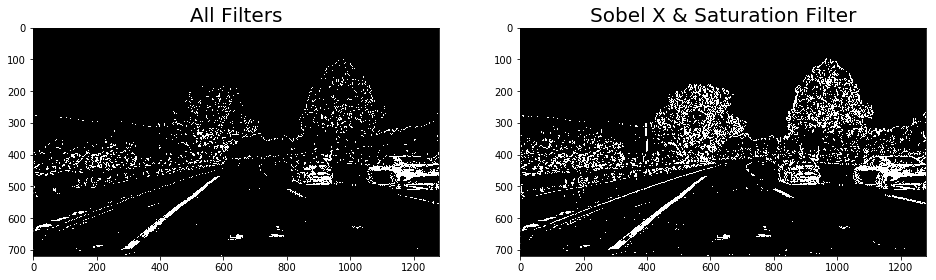

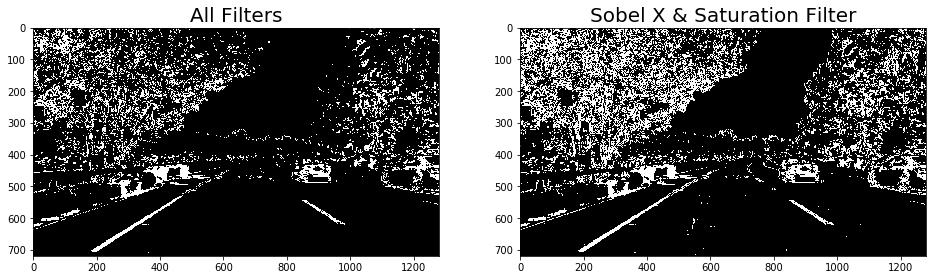

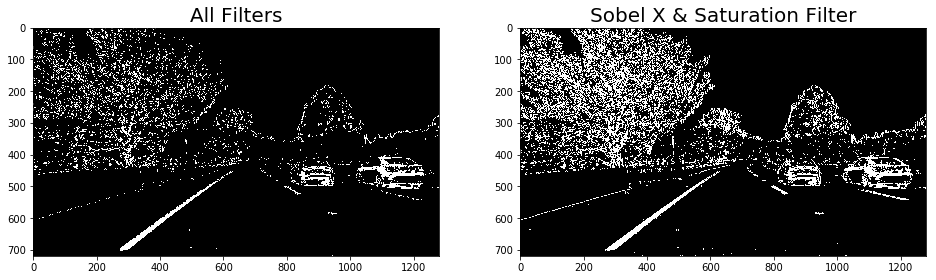

In [9]:
for i in range(6):
    load_path = 'test_images/test' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)
    
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    combined2 = np.zeros_like(sobel_x)
    combined2[(sobel_x == 1)|(s_binary == 1)] = 1
    combined3 = np.zeros_like(sobel_x)
    combined3[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
    ax1.imshow(combined1, cmap='gray')
    ax1.set_title('All Filters', fontsize=20)
    ax2.imshow(combined2, cmap='gray')
    ax2.set_title('Sobel X & Saturation Filter', fontsize=20)

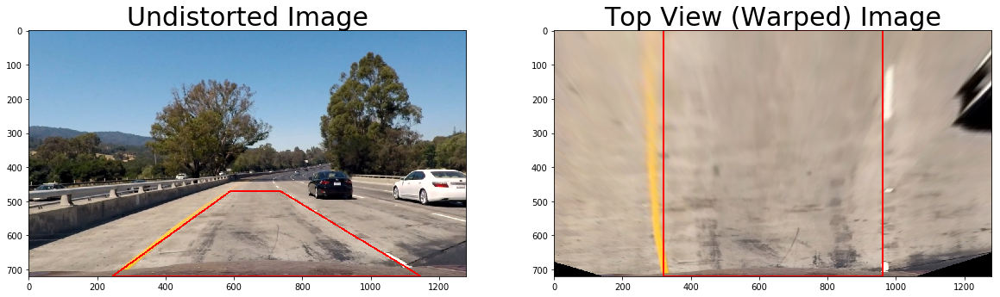

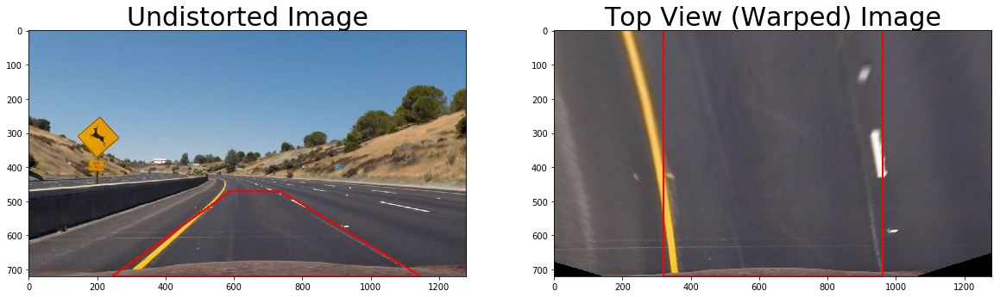

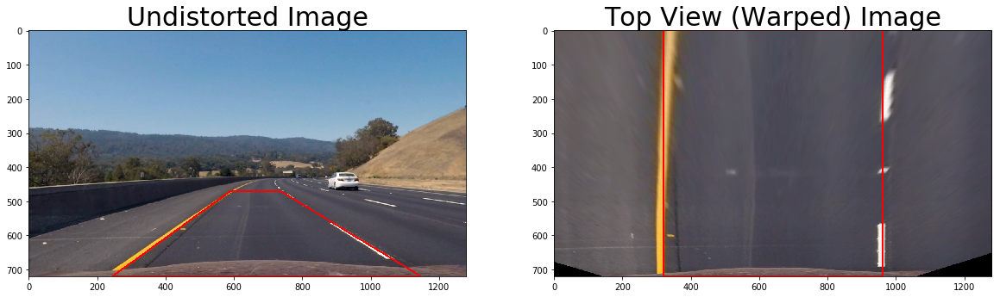

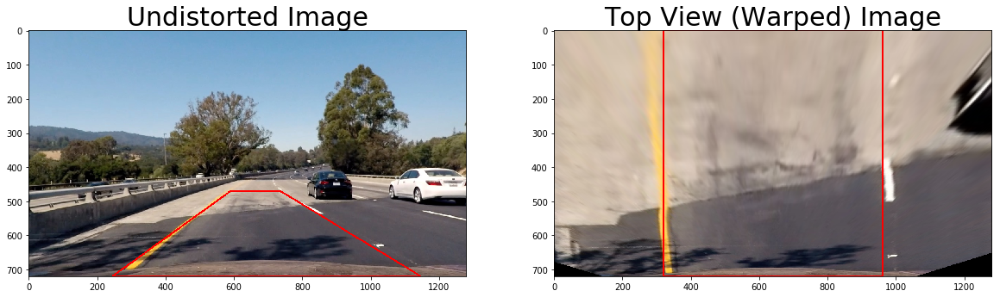

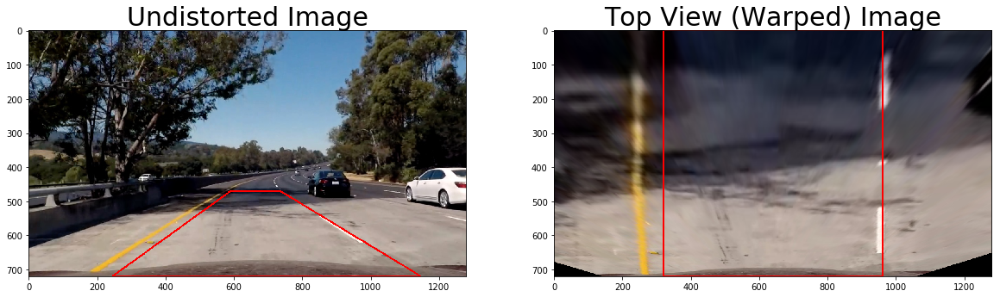

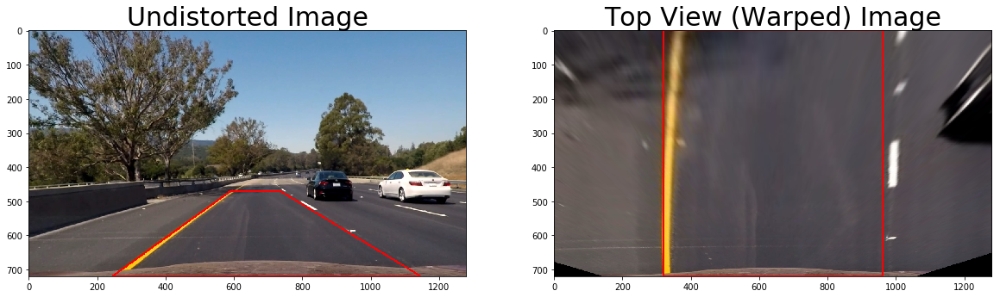

In [10]:
for i in range(6):
    load_path = 'test_images/test' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)
    
    top_view = front_to_top_view(und_img)
    warped = top_view['warped']
    dst = top_view['dst']
    src = top_view['src']
    Minv = top_view['Minv'] # save for use in step 6

    pts1 = np.array(src, np.int32)
    pts1 = pts1.reshape((-1,1,2))
    cv2.polylines(und_img,[pts1],True,(255,0,0),3)

    pts2 = np.array(dst, np.int32)
    pts2 = pts2.reshape((-1,1,2))
    cv2.polylines(warped,[pts2],True,(255,0,0),3)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(und_img)
    ax1.set_title('Undistorted Image', fontsize=30)
    ax2.imshow(warped)
    ax2.set_title('Top View (Warped) Image', fontsize=30)

Curvature Radius: 1790.6273138m
Car offset: 0.0290714285714m towards right
left_fit_var:  [  1.27907370e-04  -4.05179132e-02   2.84029639e+02] 
 right_fit_var:  [  7.15077572e-05  -7.64648846e-02   9.86255339e+02] 

Curvature Radius: 1100.39047692m
Car offset: -0.0290714285714m towards left
left_fit_var:  [ -1.55792118e-04   3.06937652e-01   2.11729374e+02] 
 right_fit_var:  [ -1.43247328e-04   2.25100933e-01   8.85040681e+02] 

Curvature Radius: 2168.91643384m
Car offset: 0.0475714285714m towards right
left_fit_var:  [  6.22856264e-05  -8.95356105e-02   3.42952877e+02] 
 right_fit_var:  [  9.65389381e-05  -1.18734998e-01   9.91931263e+02] 

Curvature Radius: 2099.68365144m
Car offset: -0.0449285714286m towards left
left_fit_var:  [  4.72312759e-05   3.95214841e-02   2.84011876e+02] 
 right_fit_var:  [  2.27801116e-04  -1.75776170e-01   1.00900018e+03] 

Curvature Radius: 1044.86428453m
Car offset: 0.198214285714m towards right
left_fit_var:  [ -3.33450195e-04   3.47589350e-01   1.6901

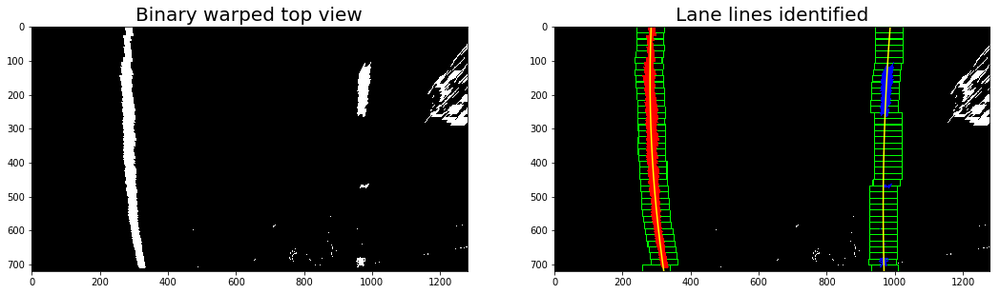

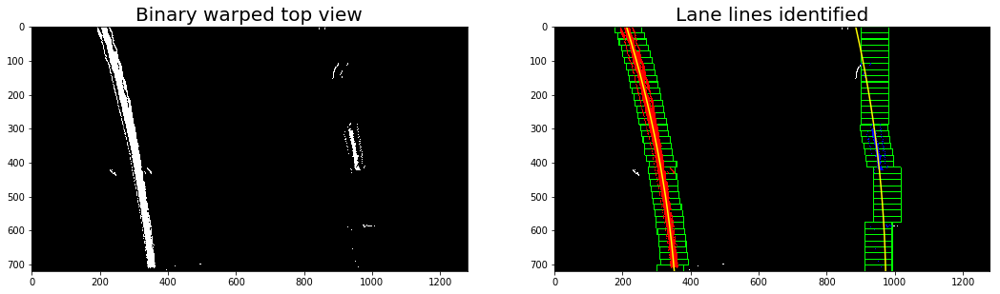

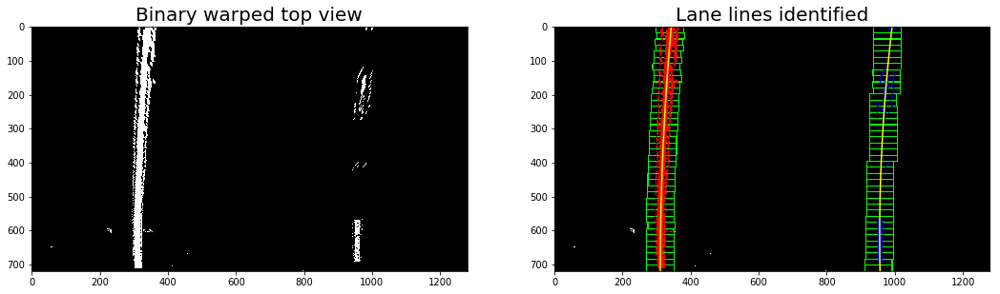

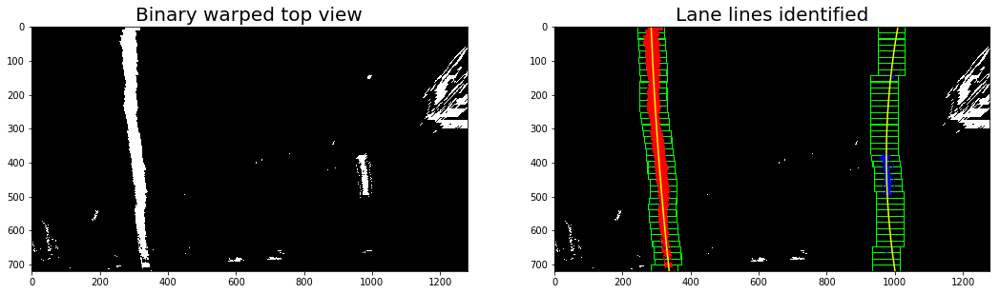

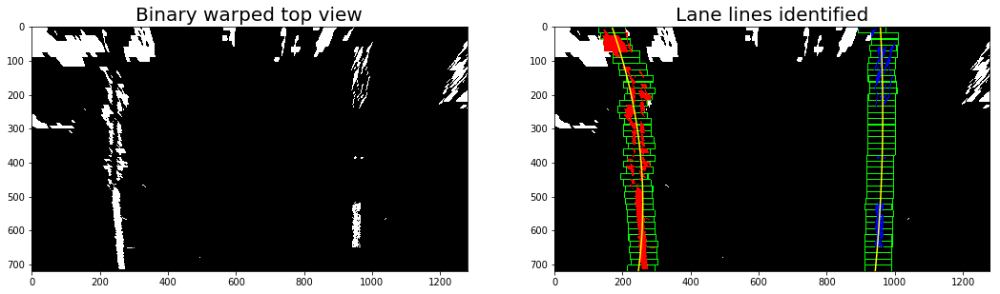

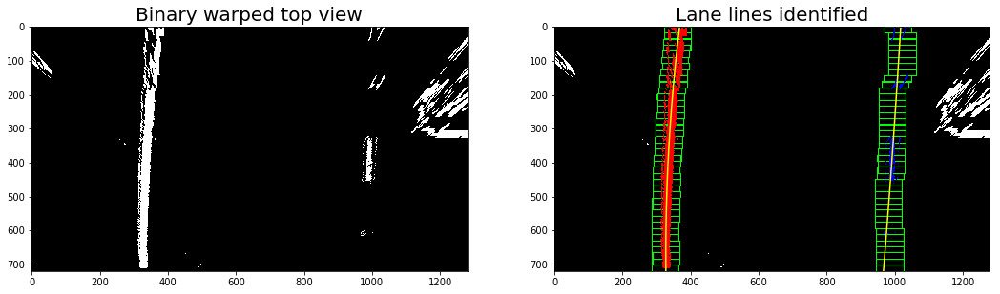

In [11]:
for i in range(6):
    load_path = 'test_images/test' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    und_img = undistort_img(raw_img)    # Apply each of the thresholding functions 
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    top_view = front_to_top_view(combined1)
    warped = top_view['warped']    

    fit_poly = fit_polynomial(warped, nwindows = 40, margin = 40, minpix = 40)
    
    # FIT VARIABLES
    left_fit_var = fit_poly['left_fit_var']
    right_fit_var = fit_poly['right_fit_var']
    
    # ALL NON ZERO INDICES INDICATING WHITE POINTS
    nonzerox= fit_poly['nonzerox']
    nonzeroy = fit_poly['nonzeroy']
    
    # INDICES CORRESPONDING TO LANES
    left_lane_inds = fit_poly['left_lane_inds']
    right_lane_inds = fit_poly['right_lane_inds']
    
    lane_curvature = fit_poly['lane_curvature'] 
    
    left_fit_m = fit_poly['left_fit_m']
    right_fit_m = fit_poly['right_fit_m']
    
    offset = fit_poly['offset']
    out_img = fit_poly['out_img']
    
    print('Curvature Radius: ' + str(lane_curvature) + 'm')
    print('Car offset: ' + str(offset['cam_offset']) + 'm towards ' + offset['offset_dir'])
    
    y_values = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_lane_x_pts = left_fit_var[0]*+y_values**2 + left_fit_var[1]*y_values + left_fit_var[2]
    right_lane_x_pts = right_fit_var[0]*y_values**2 + right_fit_var[1]*y_values + right_fit_var[2]
    print('left_fit_var: ',left_fit_var,'\n','right_fit_var: ',right_fit_var,'\n')
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize = (18,9))
    ax1.imshow(warped, cmap = 'gray')
    ax1.set_title('Binary warped top view', fontsize = 20)
    ax2.imshow(out_img)
    ax2.plot(left_lane_x_pts, y_values, color='yellow')
    ax2.plot(right_lane_x_pts, y_values, color='yellow')
    ax2.set_title('Lane lines identified', fontsize = 20)

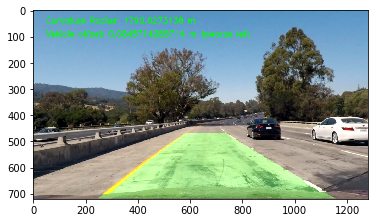

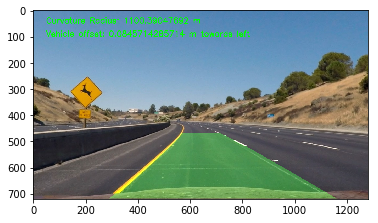

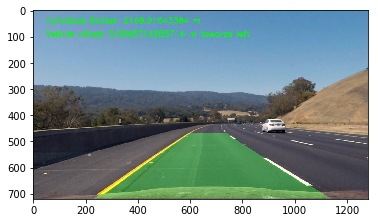

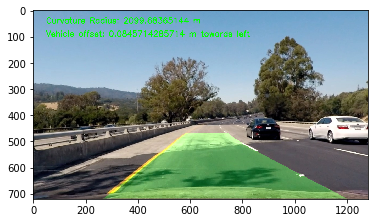

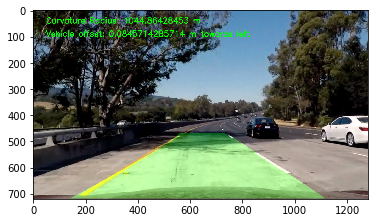

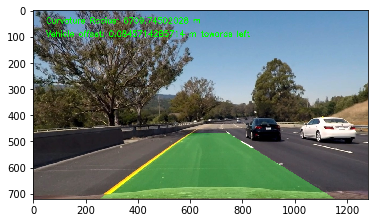

In [20]:
for i in range(6):
    load_path = 'test_images/test' + str(i+1) + '.jpg'
    raw_img = mpimg.imread(load_path)
    
    # Step 1: Undistort Image
    und_img = undistort_img(raw_img)    # Apply each of the thresholding functions 
    
    # Step 2: Apply Sobel 'X', Magnitude and Saturation Filters to undistorted image
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    
    # Step 3: Convert (warp) filtered 'front view' of undistorted image to top view (bird's eye view)
    top_view = front_to_top_view(combined1)
    warped = top_view['warped']    
    
    # Step 4: In top view, recognize lane line indices and fit a polynomial based on those
    fit_poly = fit_polynomial(warped, nwindows = 40, margin = 40, minpix = 40)
    
    # FIT VARIABLES
    left_fit_var = fit_poly['left_fit_var']
    right_fit_var = fit_poly['right_fit_var']
    curvature = fit_poly['lane_curvature']
    
    y_values = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_lane_x_pts = left_fit_var[0]*y_values**2 + left_fit_var[1]*y_values + left_fit_var[2]
    right_lane_x_pts = right_fit_var[0]*y_values**2 + right_fit_var[1]*y_values + right_fit_var[2]
    
    # Step 5: Project the fit polynomial back on the front view of the undistorted image

    lane_col_im = lane_color_and_top_2_frnt(warped, und_img, Minv, left_lane_x_pts, right_lane_x_pts, y_values)
    plt.figure()
    plt.imshow(add_curve_and_offset_info(lane_col_im, curvature, offset))

In [13]:
def pipeline(img, left_fit_var, right_fit_var):   
    # Step 1: Undistort Image
    und_img = undistort_img(img)    # Apply each of the thresholding functions 
    
    # Step 2: Apply Sobel 'X', Magnitude and Saturation Filters to undistorted image
    sobel_x = apply_sobel(und_img, 5, 'x', (20, 100))
    sobel_mag_xy = apply_sobel_xy(und_img, 5, (50, 100))
    s_binary = sat_filter(und_img, (150, 255))
    combined1 = np.zeros_like(sobel_x)
    combined1[(((sobel_x == 1) & (sobel_mag_xy == 1))| (s_binary == 1))] = 1
    
    # Step 3: Convert (warp) filtered 'front view' of undistorted image to top view (bird's eye view)
    top_view = front_to_top_view(combined1)
    warped = top_view['warped']   
    Minv = top_view['Minv']
    
    # Step 4: In top view, recognize lane line indices and fit a polynomial based on those
    fit_poly = fit_polynomial(warped, left_fit_var, right_fit_var, nwindows = 40, margin = 40, minpix = 40)
    
        # FIT VARIABLES
    left_fit_var = fit_poly['left_fit_var']
    right_fit_var = fit_poly['right_fit_var']
    
        # ALL NON ZERO INDICES INDICATING WHITE POINTS (LANE POINTS)
    nonzerox= fit_poly['nonzerox']
    nonzeroy = fit_poly['nonzeroy']
    
        # INDICES CORRESPONDING TO LANES
    left_lane_inds = fit_poly['left_lane_inds']
    right_lane_inds = fit_poly['right_lane_inds']
    
        # LANE INFORMATION IN METRES
    left_fit_m = fit_poly['left_fit_m']
    right_fit_m = fit_poly['right_fit_m']
    
        # CURVATURE & VEHICLE (CAMERA) OFFSET INFORMATION
    vehicle_offset = fit_poly['offset']
    lane_curvature = fit_poly['lane_curvature'] 
    
        # INFORMATION OF LANE LINES WHEN FITTED
    y_values = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_lane_x_pts = left_fit_var[0]*y_values**2 + left_fit_var[1]*y_values + left_fit_var[2]
    right_lane_x_pts = right_fit_var[0]*y_values**2 + right_fit_var[1]*y_values + right_fit_var[2]
   
    
    # Step 5: Project the fit polynomial back on the front view of the undistorted image
    highlight_lane_area = lane_color_and_top_2_frnt(warped, und_img, Minv, left_lane_x_pts, right_lane_x_pts, y_values)
    final_img = add_curve_and_offset_info(highlight_lane_area, lane_curvature, vehicle_offset)
    
    return {'Undistorted Image':und_img,'Top View': warped, 'Minv':Minv,\
           'left_fit_var':left_fit_var,'right_fit_var':right_fit_var,\
            'nonzerox':nonzerox,'nonzeroy':nonzeroy,\
            'left_lane_inds':left_lane_inds,'right_lane_inds':right_lane_inds,\
            'lane_curvature':lane_curvature,\
            'left_fit_m':left_fit_m,'right_fit_m':right_fit_m,\
            'vehicle_offset':vehicle_offset, 'highlight_lane_area':highlight_lane_area }

In [14]:
# PIPELINE:
class find_lanes_on_video(object):

    def __init__(self):
        self.frame_counter = 0
        self.left_fit_var = None
        self.right_fit_var = None
        
    def find_lanes_in_frame(self, frame):
        pipeline_output = pipeline(frame,self.left_fit_var,self.right_fit_var)
        if self.frame_counter >= 20: # Switch to search from prior after 20 frames
            self.left_fit_var = pipeline_output['left_fit_var']
            self.right_fit_var = pipeline_output['right_fit_var'] 
        else:
            self.left_fit_var = None
            self.right_fit_var = None
        self.frame_counter += 1
        return pipeline_output['highlight_lane_area']
            

In [15]:
my_video_processor_object = find_lanes_on_video()
output_filename = 'zzz_project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")

# .subclip(0,3)
white_clip = clip.fl_image(my_video_processor_object.find_lanes_in_frame)

%time white_clip.write_videofile(output_filename, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_filename))



[MoviePy] >>>> Building video zzz_project_video_output.mp4
[MoviePy] Writing video zzz_project_video_output.mp4


100%|█████████▉| 1260/1261 [04:23<00:00,  5.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: zzz_project_video_output.mp4 

CPU times: user 2min 3s, sys: 23.2 s, total: 2min 26s
Wall time: 4min 25s


In [16]:
# my_video_processor_object = find_lanes_on_video()
# output_filename = 'challenge_video_output.mp4.mp4'
# clip = VideoFileClip("challenge_video.mp4")

# white_clip = clip.fl_image(my_video_processor_object.find_lanes_in_frame).subclip(0,5)

# %time white_clip.write_videofile(output_filename, audio=False)

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(output_filename))

In [17]:
# BACKUP BEFORE COMBINING 'Seach from Prior'

# def fit_polynomial(top_view, nwindows = 20, margin = 50, minpix = 50):
#     histogram = np.sum(top_view[top_view.shape[0]//2:,:], axis=0)    
#     midpoint = np.int(histogram.shape[0]/2)
#     leftx_base = np.argmax(histogram[:midpoint])
#     rightx_base = np.argmax(histogram[midpoint:]) + midpoint
#     leftx_current = leftx_base
#     rightx_current = rightx_base
    
#     out_img = np.dstack((top_view, top_view, top_view))*255
#     window_height = np.int(top_view.shape[0]/nwindows)
#     nonzero = top_view.nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])    
#     left_lane_inds = []
#     right_lane_inds = []
    
#     for window in range(nwindows):
#         win_y_low = top_view.shape[0] - (window+1)*window_height
#         win_y_high = top_view.shape[0] - window*window_height
#         win_xleft_low = leftx_current - margin
#         win_xleft_high = leftx_current + margin
#         win_xright_low = rightx_current - margin
#         win_xright_high = rightx_current + margin
        
#         cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
#         cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
#         good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
#                           (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
#         good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
#                            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
#         left_lane_inds.append(good_left_inds)
#         right_lane_inds.append(good_right_inds)
#         if len(good_left_inds) > minpix:
#             leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
#         if len(good_right_inds) > minpix:        
#             rightx_current = np.int(np.mean(nonzerox[good_right_inds]))            
        
#     left_lane_inds = np.concatenate(left_lane_inds)
#     right_lane_inds = np.concatenate(right_lane_inds)    
    
#     leftx = nonzerox[left_lane_inds]
#     lefty = nonzeroy[left_lane_inds] 
#     rightx = nonzerox[right_lane_inds]
#     righty = nonzeroy[right_lane_inds]     
    
#     left_fit_var = np.polyfit(lefty, leftx, 2)
#     right_fit_var = np.polyfit(righty, rightx, 2)
    
#     ym_per_pix = 30.0/720 # meters per pixel in y dimension
#     xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
#     # Fitting for real world values
#     left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2) #metres
#     right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2) #metres# Calculate radii of curvature
    
#     y_eval = top_view.shape[0] - 1 # position at which curvature is calculated
#     left_curverad = ((1 + (2*left_fit_m[0]*y_eval*ym_per_pix + left_fit_m[1])**2)**1.5) / np.absolute(2*left_fit_m[0])
#     right_curverad = ((1 + (2*right_fit_m[0]*y_eval*ym_per_pix + right_fit_m[1])**2)**1.5) / np.absolute(2*right_fit_m[0])
#     lane_curvature = 0.5 * (left_curverad + right_curverad) 
    
#     # Camera Offset
#     lane_width = rightx_base - leftx_base
#     lane_center = leftx_base + (lane_width/2)
#     cam_location = top_view.shape[1] / 2
#     cam_offset = cam_location - lane_center
    
#     if cam_offset < 0:
#         offset_dir = 'left'
#     else:
#         offset_dir = 'right'
#     offset = {'cam_offset':cam_offset, 'offset_dir':offset_dir}
    
#     return {'left_fit_var':left_fit_var,'right_fit_var':right_fit_var,\
#             'nonzerox':nonzerox,'nonzeroy':nonzeroy,\
#             'left_lane_inds':left_lane_inds,'right_lane_inds':right_lane_inds,\
#             'lane_curvature':lane_curvature,\
#             'left_fit_m':left_fit_m,'right_fit_m':right_fit_m,\
#             'offset':offset, 'out_img':out_img }